In [1]:
import numpy as np
import matplotlib.pyplot as plt
import imageio
from glob import glob 

# https://docs.scipy.org/doc/scipy/reference/generated/scipy.ndimage.map_coordinates.html

import scipy 
from scipy import ndimage

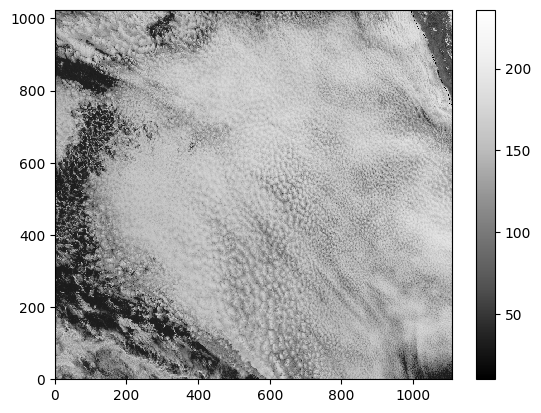

In [2]:
# Define the path to the directory containing the images
path = 'C:\\Users\\ratynski\\Documents\\Python_Projects\\stratocu_waves-main\\DATA\\2022_09_06\\'
# Use glob to find the images in the specified path
fnames = np.sort(glob(path + '*9_06*png'))
images = []

# Read the images and process them
for i, fname in enumerate(fnames):
    img = imageio.v2.imread(fname)
    red = np.flipud(img[:, 400:, 0])
    images.append(red)  # Just red channel, just 400:end in the x dir, flip y

# Plot the first processed image
plt.pcolormesh(images[0], cmap='Greys_r')
plt.colorbar()
plt.show()


In [3]:
# Get the dimensions of the image
height, width = red.shape[:2]

# Create 2D arrays of x and y
x = np.arange(width)
y = np.arange(height)

# Create a meshgrid of x and y
X, Y = np.meshgrid(x, y)


# Pixel size: nominal for MKS units to pixel units 
DX = 2000             # m, pixel size (nominal)

# Xm and Ym are Coordinates in meters, distances measured from central point of image
Xm = (X-X.mean())*DX
Ym = (Y-Y.mean())*DX 

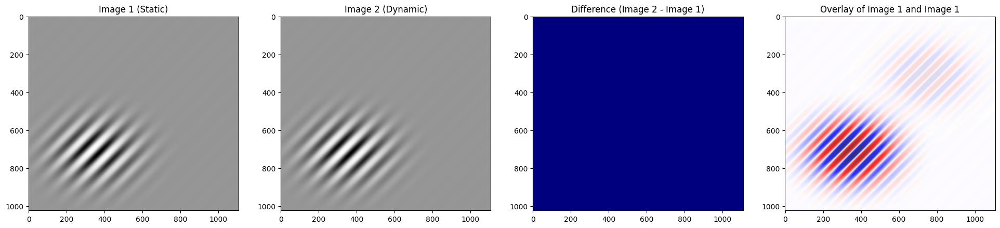

In [4]:
from IPython.display import HTML
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
from scipy import ndimage

# Define the frame distance (number of frames between the two images)
time_steps = 10            # Number of time steps
time_resolution = 1800     # seconds, images are half an hour apart
height, width = Xm.shape

# One wave packet 
cphase = 14            # m/s
wavelength = 150*1000. # meters
period = wavelength/cphase 
direction = 225       # navigation angle of FROM direction in degrees (225 = FROM SW, toward NE) 
zamplitude = 100      # meters, vertical displacement
PBLdepth = 1000       # m, divergent winds assumed to be constant through this layer  

# Wavenumbers computed from wavelengths and direction, units radians per meter
k = 2*np.pi/wavelength * np.sin((direction) * np.pi/180)   
l = 2*np.pi/wavelength * np.cos((direction) * np.pi/180)   

# Amplitude modulation by a big smooth Gaussian for image1 and image2
packet_center_x = -400*1000  # meters, from middle of Xm, Ym coordinates  
packet_center_y = 400*1000   # meters, from middle of Xm, Ym coordinates  
packet_width_x  = 400*1000.  # meters
packet_width_y  = 300*1000.  # meters
Ampwindow = np.exp(-( ((Xm-packet_center_x)/packet_width_x)**2 + \
                      ((Ym-packet_center_y)/packet_width_y)**2 )) 

# Create a figure with 4 subplots (adding one for the overlay)
fig, axes = plt.subplots(1, 4, figsize=(24, 6))

# Initialize variables for the images
image1 = None
image2 = None

# Function to initialize the animation 
def init():
    global image1, image2
    t1 = 0
    dz1 = zamplitude * np.sin(k * (Xm - cphase * t1) + l * (Ym - cphase * t1)) * Ampwindow

    image1 = dz1

    im1 = axes[0].imshow(image1, cmap='Greys_r')
    im2 = axes[1].imshow(image1, cmap='Greys_r')  # Initial overlay with itself
    diff = axes[2].imshow(np.zeros_like(image1), cmap='jet')
    
    # Initialize the overlay visualization with image1 over itself
    axes[3].imshow(image1, cmap='seismic', alpha=0.5)
    axes[3].imshow(image1, cmap='seismic', alpha=0.5)

    axes[0].set_title('Image 1 (Static)')
    axes[1].set_title('Image 2 (Dynamic)')
    axes[2].set_title('Difference (Image 2 - Image 1)')
    axes[3].set_title('Overlay of Image 1 and Image 1')

    return [im1, im2, diff]

# Function to animate the frames
def animate(it):
    global image1, image2
    t = it * time_resolution

    # Generate image2 at time t, at the same location as image1
    dz2 = zamplitude * np.sin(k * (Xm - cphase * t) + l * (Ym - cphase * t)) * Ampwindow

    image2 = dz2

    im2 = axes[1].imshow(image2, cmap='Greys_r')
    diff = axes[2].imshow(image2 - image1, cmap='jet')
    
    # Update the overlay visualization with image1 and the symmetric image2 (shifted upwards)
    symmetric_packet_center_y = -packet_center_y  # Mirror the y position only for the overlay
    symmetric_packet_center_x = -packet_center_x # Mirror the x position only for the overlay
    Ampwindow_symmetric = np.exp(-( ((Xm-symmetric_packet_center_x )/packet_width_x)**2 + \
                                   ((Ym-symmetric_packet_center_y)/packet_width_y)**2 ))
    
    image2_symmetric = zamplitude * np.sin(k * (Xm - cphase * t) + l * (Ym - cphase * t)) * Ampwindow_symmetric
    
    axes[3].clear()
    axes[3].imshow(image1, cmap='seismic', alpha=0.5)
    axes[3].imshow(image2_symmetric, cmap='seismic', alpha=0.5)
    axes[3].set_title(f'Overlay at Time Step {it}')

    axes[1].set_title(f'Image 2 (Time Step {it})')
    axes[2].set_title(f'Difference (Time Step {it})')

    return [im2, diff]

# Create an animation
ani = animation.FuncAnimation(fig, animate, init_func=init, frames=time_steps, repeat=True)

# Display the animation in the Jupyter Notebook
HTML(ani.to_jshtml())


In [ ]:
# Constants for this animation 
time_steps = 10            # Number of time steps 
time_resolution = 1800     # seconds, images are half an hour apart

import matlab.engine
import numpy as np
import matplotlib.pyplot as plt

# Start MATLAB engine
eng = matlab.engine.start_matlab()

# Assuming Xm and Ym, time_steps, time_resolution, k, l, cphase, zamplitude, Ampwindow, DX, direction, 
# k2, l2, cphase2, zamplitude2, PBLdepth, wavelength, PBLdepth2, wavelength2, direction2, Ampwindow2 
# are defined earlier in the code

# One wave packet 
cphase = 14            # m/s
wavelength = 150*1000. # meters
period = wavelength/cphase 
direction = 225       # navigation angle of FROM direction in degrees (225 = FROM SW, toward NE) 
zamplitude = 100      # meters, vertical displacement
PBLdepth = 1000       # m, divergent winds assumed to be constant through this layer  

# Wavenumbers computed from wavelengths and direction, units radians per meter
k = 2*np.pi/wavelength * np.sin( (direction) *np.pi/180 )   
l = 2*np.pi/wavelength * np.cos( (direction) *np.pi/180 )   

# Amplitude modulation by a big smooth Gaussian 
packet_center_x = 0*1000  # meters, from middle of Xm, Ym coordinates  
packet_center_y = 0*1000   # meters, from middle of Xm, Ym coordinates  
packet_width_x  = 400*1000.  # meters
packet_width_y  = 300*1000.  # meters
Ampwindow = np.exp(-( ((Xm-packet_center_x)/packet_width_x)**2 + \
                      ((Ym-packet_center_y)/packet_width_y)**2 )) 

# Initialize image1 and image2 as arrays
image1 = None
image2 = None

# Define the frame distance (number of frames between the two images)
frame_distance = 5 # Adjust this value as needed

# Loop over the two time steps (t1 and t2) considering frame distance
for it in range(2):
    t = it * frame_distance * time_resolution  # Calculate time for each image
        # Store the images based on the iteration
    if it == 0:

        # Calculate dz, dx, dy for each time step
        dz = zamplitude * np.sin(k * (Xm - cphase * t) + l * (Ym - cphase * t)) * Ampwindow 

        dxy = (zamplitude / PBLdepth) * wavelength \
            * np.sin(k * (Xm - cphase * t) + l * (Ym - cphase * t) - np.pi/2.) / DX
        dx = dxy * np.sin(direction * np.pi/180.) * Ampwindow 
        dy = dxy * np.cos(direction * np.pi/180.) * Ampwindow

        image1 = dz  # Store dy for the first time step
    
    elif it == 1:

        packet_center_x = 400*1000  # meters, from middle of Xm, Ym coordinates  
        packet_center_y = 400*1000   # meters, from middle of Xm, Ym coordinates  
        Ampwindow = np.exp(-( ((Xm-packet_center_x)/packet_width_x)**2 + \
                            ((Ym-packet_center_y)/packet_width_y)**2 )) 
        
        # Calculate dz, dx, dy for each time step
        dz = zamplitude * np.sin(k * (Xm - cphase * t) + l * (Ym - cphase * t)) * Ampwindow 

        dxy = (zamplitude / PBLdepth) * wavelength \
            * np.sin(k * (Xm - cphase * t) + l * (Ym - cphase * t) - np.pi/2.) / DX
        dx = dxy * np.sin(direction * np.pi/180.) * Ampwindow 
        dy = dxy * np.cos(direction * np.pi/180.) * Ampwindow

        image2 = dz  # Store dy for the second time step

# Ensure image1 and image2 are properly generated
if image1 is not None and image2 is not None:
    image1_mat = matlab.double(image1.tolist())
    image2_mat = matlab.double(image2.tolist())

    # Define wavelet parameters
    wavelet_name = 'morlet'
    params = [2.0, 3.0, 1.0]
    wavelet_struct = {'name': wavelet_name, 'param': params}
    scales = np.linspace(1, 50, 50)
    scales_km = (4 * np.pi * scales) / (params[0] + np.sqrt(2 + params[0]**2)) * 2  # Convert scales to km
    scales_matlab = matlab.double(scales.tolist())

    # Perform 2D CWT on both images
    cwt_image1 = np.array(eng.cwtft2(image1_mat, 'wavelet', wavelet_struct, 'scales', scales_matlab)['cfs'])
    cwt_image2 = np.array(eng.cwtft2(image2_mat, 'wavelet', wavelet_struct, 'scales', scales_matlab)['cfs'])

    # Compute the cross-wavelet spectrum (XWT)
    xwt = cwt_image1 * np.conj(cwt_image2)

    # Coherence (amplitude)
    coherence = np.abs(xwt) 

    # Phase difference
    phase_difference = np.angle(xwt)

    # Select a specific scale (e.g., the 25th scale)
    selected_scale_index = 20

    # Step 1: Define a threshold for coherence, equal to 50% of the maximum coherence
    coherence_threshold = 0 * np.max(coherence[:, :, 0, selected_scale_index])   

    # Step 2: Create a mask where coherence is above the threshold
    movement_mask = coherence[:, :, 0, selected_scale_index] > coherence_threshold

    # Apply the mask to the phase difference
    phase_difference_masked = np.ma.masked_where(~movement_mask, phase_difference[:, :, 0, selected_scale_index] / np.pi)

    # Displacement in pixels (proportional to the phase difference)
    displacement_pixels = phase_difference_masked / (2 * np.pi)

    # Convert displacement to km (1 pixel = 2 km)
    pixel_to_km = 2  # 1 pixel = 2 km
    displacement_km = displacement_pixels * pixel_to_km

    # Calculate speed in km/s (displacement over time interval)
    time_interval = frame_distance * time_resolution  # Adjust the time interval accordingly
    speed = displacement_km / time_interval

    # Calculate direction based on phase difference gradients
    gradient_y, gradient_x = np.gradient(phase_difference_masked)
    direction = np.degrees(np.arctan2(gradient_y, gradient_x))

    # Step 3: Plot the results
    plt.figure(figsize=(14, 8))

    # Plot Coherence for the selected scale
    plt.subplot(1, 2, 1)
    plt.pcolormesh(coherence[:, :, 0, selected_scale_index], cmap='viridis')
    plt.colorbar()
    plt.pcolormesh(image1, cmap='gray', alpha=0.2)
    plt.title(f'Coherence (Scale: {scales_km[selected_scale_index]:.2f} km)')

    # Plot Phase Difference for the selected scale with masking applied
    plt.subplot(1, 2, 2)
    plt.pcolormesh(phase_difference_masked, cmap='twilight', vmin=-1, vmax=1)
    plt.colorbar(ticks=[-1, -0.5, 0, 0.5, 1], format='%.1fπ')
    # plt.pcolormesh(image1, cmap='gray', alpha=0.2)
    plt.title(f'Phase Difference (Focused on Movement) (Scale: {scales_km[selected_scale_index]:.2f} km)')

    # Display calculated speed and direction
    print(f"Wave speed (mean across region): {np.mean(speed*1000):.4f} m/s")
    print(f"Wave direction (mean across region): {np.mean(direction):.2f} degrees")

    plt.show()

# End MATLAB session
eng.quit()


Wave speed (mean across region): -0.0727 m/s
Wave direction (mean across region): 9.58 degrees


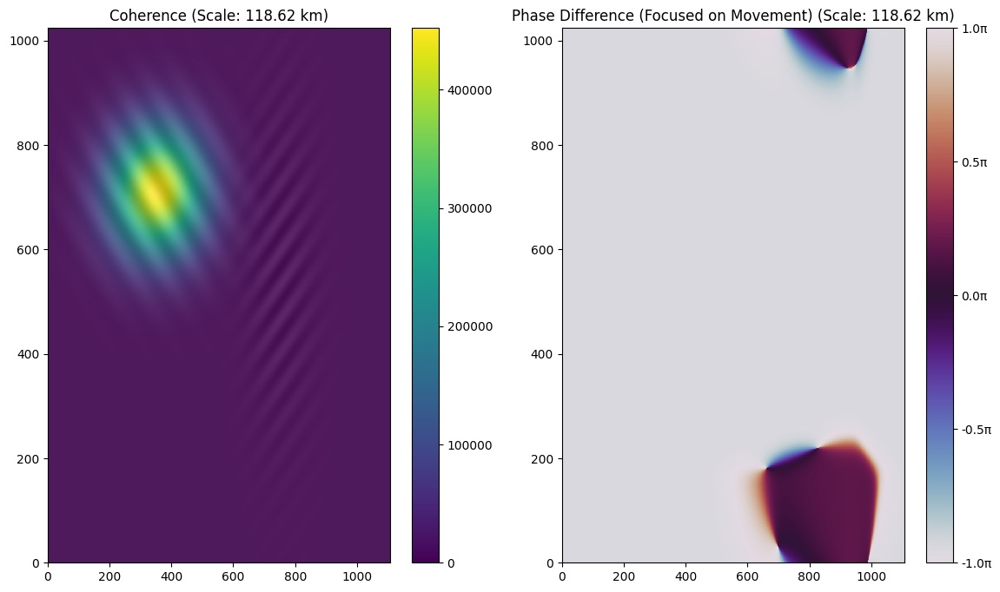

In [41]:
# One wave packet 
cphase = 14            # m/s
wavelength = 150*1000. # meters
period = wavelength/cphase 
direction = 225       # navigation angle of FROM direction in degrees (225 = FROM SW, toward NE) 
zamplitude = 100      # meters, vertical displacement
PBLdepth = 1000       # m, divergent winds assumed to be constant through this layer  

# Wavenumbers computed from wavelengths and direction, units radians per meter
k = 2*np.pi/wavelength * np.sin( (direction) *np.pi/180 )   
l = 2*np.pi/wavelength * np.cos( (direction) *np.pi/180 )   

# Amplitude modulation by a big smooth Gaussian 
packet_center_x = -400*1000  # meters, from middle of Xm, Ym coordinates  
packet_center_y = 400*1000   # meters, from middle of Xm, Ym coordinates  
packet_width_x  = 400*1000.  # meters
packet_width_y  = 300*1000.  # meters
Ampwindow = np.exp(-( ((Xm-packet_center_x)/packet_width_x)**2 + \
                      ((Ym-packet_center_y)/packet_width_y)**2 )) 
     
#plt.pcolormesh(Ampwindow); plt.colorbar()

# A second wave packet 
cphase2 = 20            # m/s
wavelength2 = 100*1000. # meters
period2 = wavelength2/cphase2 
direction2 = 140       # navigation angle of FROM direction in degrees (225 = FROM SW, toward NE) 
zamplitude2 = 50      # meters, vertical displacement
PBLdepth2 = 1000       # m, divergent winds assumed to be constant through this layer  

# Wavenumbers computed from wavelengths and direction, units radians per meter
k2 = 2*np.pi/wavelength2 * np.sin( (direction2) *np.pi/180 )   
l2 = 2*np.pi/wavelength2 * np.cos( (direction2) *np.pi/180 )   

# Amplitude modulation by a big smooth Gaussian 
packet_center_x2 = 400*1000  # meters, from middle of Xm, Ym coordinates  
packet_center_y2 = 100*1000   # meters, from middle of Xm, Ym coordinates  
packet_width_x2  = 200*1000.  # meters
packet_width_y2  = 600*1000.  # meters
Ampwindow2 = np.exp(-( ((Xm-packet_center_x2)/packet_width_x2)**2 + \
                      ( (Ym-packet_center_y2)/packet_width_y2)**2 )) 

# Initialize image1 and image2 as arrays
image1 = None
image2 = None

# Define the frame distance (number of frames between the two images)
frame_distance = 2 # Adjust this value as needed

# Loop over the two time steps (t1 and t2) considering frame distance
for it in range(2):
    t = it * frame_distance * time_resolution  # Calculate time for each image
        # Store the images based on the iteration
    if it == 0:

        # Calculate dz, dx, dy for each time step
        dz = zamplitude \
                * np.sin( k*(Xm - cphase*t)+l*(Ym - cphase*t) ) *Ampwindow 
        dz2 = zamplitude2 \
                * np.sin( k2*(Xm - cphase2*t)+l2*(Ym - cphase2*t) ) *Ampwindow2

        # wave dx and dy are 90deg behind phase with dz, prop. to wavelength. 
        # DIRECTION: For 45deg (wave going NE), k>0,l>0, dx>0,dy>0 (sketch it). 

        dxy = (zamplitude/PBLdepth)*wavelength \
            * np.sin( k*(Xm - cphase*t)+l*(Ym - cphase*t) -np.pi/2.) /DX
        dx = dxy * np.sin(direction *np.pi/180.) *Ampwindow # why /2? because it is too strong. Pixel units?? 
        dy = dxy * np.cos(direction *np.pi/180.) *Ampwindow

        dxy2= (zamplitude2/PBLdepth2)*wavelength2 \
            * np.sin( k2*(Xm - cphase2*t)+l2*(Ym - cphase2*t) -np.pi/2.) /DX
        dx2= dxy2* np.sin(direction2 *np.pi/180.) *Ampwindow2 
        dy2= dxy2* np.cos(direction2 *np.pi/180.) *Ampwindow2

        image1 = dz+dz2  # Store dy for the first time step
    
    elif it == 1:

        # packet_center_x = 400*1000  # meters, from middle of Xm, Ym coordinates  
        # packet_center_y = 400*1000   # meters, from middle of Xm, Ym coordinates  
        # Ampwindow = np.exp(-( ((Xm-packet_center_x)/packet_width_x)**2 + \
                            # ((Ym-packet_center_y)/packet_width_y)**2 )) 
        
        # Calculate dz, dx, dy for each time step
        dz = zamplitude \
                * np.sin( k*(Xm - cphase*t)+l*(Ym - cphase*t) ) *Ampwindow 
        dz2 = zamplitude2 \
                * np.sin( k2*(Xm - cphase2*t)+l2*(Ym - cphase2*t) ) *Ampwindow2

        # wave dx and dy are 90deg behind phase with dz, prop. to wavelength. 
        # DIRECTION: For 45deg (wave going NE), k>0,l>0, dx>0,dy>0 (sketch it). 

        dxy = (zamplitude/PBLdepth)*wavelength \
            * np.sin( k*(Xm - cphase*t)+l*(Ym - cphase*t) -np.pi/2.) /DX
        dx = dxy * np.sin(direction *np.pi/180.) *Ampwindow # why /2? because it is too strong. Pixel units?? 
        dy = dxy * np.cos(direction *np.pi/180.) *Ampwindow

        dxy2= (zamplitude2/PBLdepth2)*wavelength2 \
            * np.sin( k2*(Xm - cphase2*t)+l2*(Ym - cphase2*t) -np.pi/2.) /DX
        dx2= dxy2* np.sin(direction2 *np.pi/180.) *Ampwindow2 
        dy2= dxy2* np.cos(direction2 *np.pi/180.) *Ampwindow2

        image2 = dz+dz2 # Store dy for the second time step

# Start MATLAB engine
eng = matlab.engine.start_matlab()

# Ensure image1 and image2 are properly generated
if image1 is not None and image2 is not None:
    image1_mat = matlab.double(image1.tolist())
    image2_mat = matlab.double(image2.tolist())

    # Define wavelet parameters
    wavelet_name = 'morlet'
    params = [2.0, 3.0, 1.0]
    wavelet_struct = {'name': wavelet_name, 'param': params}
    scales = np.linspace(1, 50, 50)
    scales_km = (4 * np.pi * scales) / (params[0] + np.sqrt(2 + params[0]**2)) * 2  # Convert scales to km
    scales_matlab = matlab.double(scales.tolist())
    angles = [3*np.pi/4]  # Focus on one angle
    angles_matlab = matlab.double(angles)

    # Perform 2D CWT on both images
    cwt_image1 = np.array(eng.cwtft2(image1_mat, 'wavelet', wavelet_struct, 'scales', scales_matlab, 'angles', angles_matlab)['cfs'])
    cwt_image2 = np.array(eng.cwtft2(image2_mat, 'wavelet', wavelet_struct, 'scales', scales_matlab, 'angles', angles_matlab)['cfs'])

    # Compute the cross-wavelet spectrum (XWT)
    xwt = cwt_image1 * np.conj(cwt_image2)

    # Coherence (amplitude)
    coherence = np.abs(xwt) 

    # Phase difference
    phase_difference = np.angle(xwt)

    # Select a specific scale (e.g., the 25th scale)
    selected_scale_index = 20

    # Step 1: Define a threshold for coherence, equal to 50% of the maximum coherence
    coherence_threshold = 0 * np.max(coherence[:, :, 0, selected_scale_index])   

    # Step 2: Create a mask where coherence is above the threshold
    movement_mask = coherence[:, :, 0, selected_scale_index] > coherence_threshold

    # Apply the mask to the phase difference
    phase_difference_masked = np.ma.masked_where(~movement_mask, phase_difference[:, :, 0, selected_scale_index] / np.pi)

    # Displacement in pixels (proportional to the phase difference)
    displacement_pixels = phase_difference_masked / (2 * np.pi)

    # Convert displacement to km (1 pixel = 2 km)
    pixel_to_km = 2  # 1 pixel = 2 km
    displacement_km = displacement_pixels * pixel_to_km

    # Calculate speed in km/s (displacement over time interval)
    time_interval = frame_distance * time_resolution  # Adjust the time interval accordingly
    speed = displacement_km / time_interval

    # Calculate direction based on phase difference gradients
    gradient_y, gradient_x = np.gradient(phase_difference_masked)
    direction = np.degrees(np.arctan2(gradient_y, gradient_x))

    # Step 3: Plot the results
    plt.figure(figsize=(14, 8))

    # Plot Coherence for the selected scale
    plt.subplot(1, 2, 1)
    plt.pcolormesh(coherence[:, :, 0, selected_scale_index], cmap='viridis')
    plt.colorbar()
    plt.pcolormesh(image1, cmap='gray', alpha=0.2)
    plt.title(f'Coherence (Scale: {scales_km[selected_scale_index]:.2f} km)')

    # Plot Phase Difference for the selected scale with masking applied
    plt.subplot(1, 2, 2)
    plt.pcolormesh(phase_difference_masked, cmap='twilight', vmin=-1, vmax=1)
    plt.colorbar(ticks=[-1, -0.5, 0, 0.5, 1], format='%.1fπ')
    # plt.pcolormesh(image1, cmap='gray', alpha=0.2)
    plt.title(f'Phase Difference (Focused on Movement) (Scale: {scales_km[selected_scale_index]:.2f} km)')

    # Display calculated speed and direction
    print(f"Wave speed (mean across region): {np.mean(speed*1000):.4f} m/s")
    print(f"Wave direction (mean across region): {np.mean(direction):.2f} degrees")

    plt.show()

# End MATLAB session
eng.quit()
        
     

Wave speed (mean across region): -0.0131 m/s
Wave direction (mean across region): 4.67 degrees


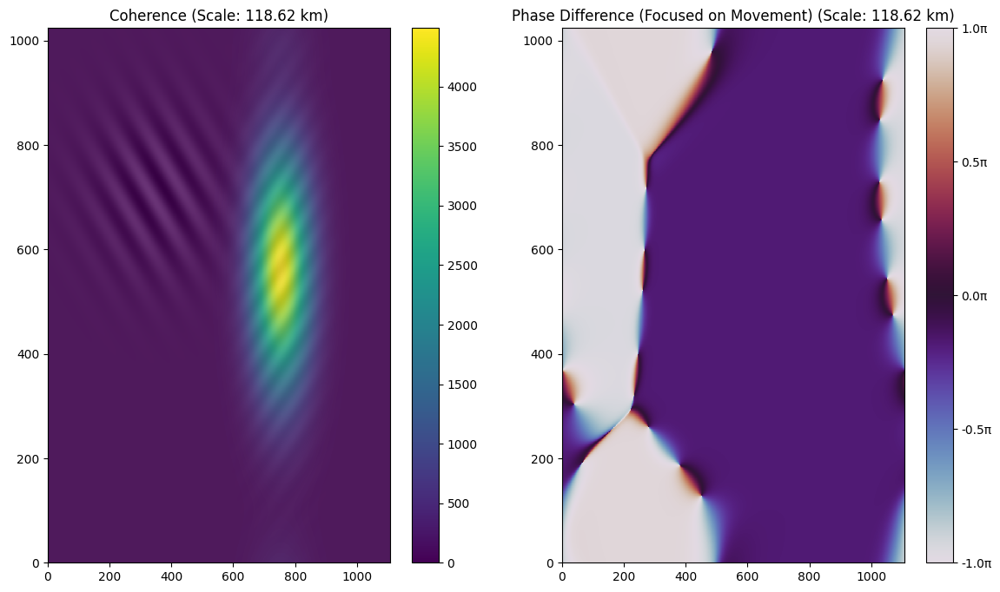

In [42]:
# start MATLAB engine
eng = matlab.engine.start_matlab()

# Ensure image1 and image2 are properly generated
if image1 is not None and image2 is not None:
    image1_mat = matlab.double(image1.tolist())
    image2_mat = matlab.double(image2.tolist())

    # Define wavelet parameters
    wavelet_name = 'morlet'
    params = [2.0, 3.0, 1.0]
    wavelet_struct = {'name': wavelet_name, 'param': params}
    scales = np.linspace(1, 50, 50)
    scales_km = (4 * np.pi * scales) / (params[0] + np.sqrt(2 + params[0]**2)) * 2  # Convert scales to km
    scales_matlab = matlab.double(scales.tolist())
    angles = [np.pi/4]  # Focus on one angle
    angles_matlab = matlab.double(angles)

    # Perform 2D CWT on both images
    cwt_image1 = np.array(eng.cwtft2(image1_mat, 'wavelet', wavelet_struct, 'scales', scales_matlab, 'angles', angles_matlab)['cfs'])
    cwt_image2 = np.array(eng.cwtft2(image2_mat, 'wavelet', wavelet_struct, 'scales', scales_matlab, 'angles', angles_matlab)['cfs'])

    # Compute the cross-wavelet spectrum (XWT)
    xwt = cwt_image1 * np.conj(cwt_image2)

    # Coherence (amplitude)
    coherence = np.abs(xwt) 

    # Phase difference
    phase_difference = np.angle(xwt)

    # Select a specific scale (e.g., the 25th scale)
    selected_scale_index = 20

    # Step 1: Define a threshold for coherence, equal to 50% of the maximum coherence
    coherence_threshold = 0 * np.max(coherence[:, :, 0, selected_scale_index])   

    # Step 2: Create a mask where coherence is above the threshold
    movement_mask = coherence[:, :, 0, selected_scale_index] > coherence_threshold

    # Apply the mask to the phase difference
    phase_difference_masked = np.ma.masked_where(~movement_mask, phase_difference[:, :, 0, selected_scale_index] / np.pi)

    # Displacement in pixels (proportional to the phase difference)
    displacement_pixels = phase_difference_masked / (2 * np.pi)

    # Convert displacement to km (1 pixel = 2 km)
    pixel_to_km = 2  # 1 pixel = 2 km
    displacement_km = displacement_pixels * pixel_to_km

    # Calculate speed in km/s (displacement over time interval)
    time_interval = frame_distance * time_resolution  # Adjust the time interval accordingly
    speed = displacement_km / time_interval

    # Calculate direction based on phase difference gradients
    gradient_y, gradient_x = np.gradient(phase_difference_masked)
    direction = np.degrees(np.arctan2(gradient_y, gradient_x))

    # Step 3: Plot the results
    plt.figure(figsize=(14, 8))

    # Plot Coherence for the selected scale
    plt.subplot(1, 2, 1)
    plt.pcolormesh(coherence[:, :, 0, selected_scale_index], cmap='viridis')
    plt.colorbar()
    plt.pcolormesh(image1, cmap='gray', alpha=0.2)
    plt.title(f'Coherence (Scale: {scales_km[selected_scale_index]:.2f} km)')

    # Plot Phase Difference for the selected scale with masking applied
    plt.subplot(1, 2, 2)
    plt.pcolormesh(phase_difference_masked, cmap='twilight', vmin=-1, vmax=1)
    plt.colorbar(ticks=[-1, -0.5, 0, 0.5, 1], format='%.1fπ')
    # plt.pcolormesh(image1, cmap='gray', alpha=0.2)
    plt.title(f'Phase Difference (Focused on Movement) (Scale: {scales_km[selected_scale_index]:.2f} km)')

    # Display calculated speed and direction
    print(f"Wave speed (mean across region): {np.mean(speed*1000):.4f} m/s")
    print(f"Wave direction (mean across region): {np.mean(direction):.2f} degrees")

    plt.show()

# End MATLAB session
eng.quit()

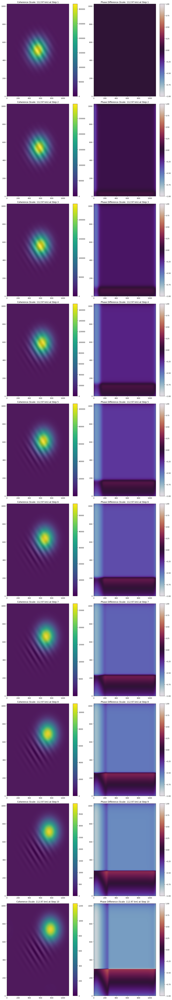

In [37]:
import matlab.engine
import numpy as np
import matplotlib.pyplot as plt

# Start MATLAB engine
eng = matlab.engine.start_matlab()

# Constants for this animation
time_steps = 10            # Number of time steps
time_resolution = 1800     # seconds, images are half an hour apart

# Assuming Xm and Ym are defined earlier in your code

# Wave packet parameters
cphase = 14  # m/s
wavelength = 150*1000  # meters
direction = 225  # FROM direction in degrees
zamplitude = 100  # meters, vertical displacement
PBLdepth = 1000  # m, divergent winds assumed to be constant through this layer

# Wavenumbers computed from wavelengths and direction, units radians per meter
k = 2 * np.pi / wavelength * np.sin(direction * np.pi / 180)
l = 2 * np.pi / wavelength * np.cos(direction * np.pi / 180)

# Amplitude modulation by a big smooth Gaussian
packet_width_x = 400*1000  # meters
packet_width_y = 300*1000  # meters

# Fixed time to freeze the wave pattern
t_fixed = 0  # Setting time to 0 to freeze the wave pattern

# Initial position for image1
packet_center_x = 0*1000  # meters
packet_center_y = 0*1000  # meters
Ampwindow = np.exp(-(((Xm - packet_center_x) / packet_width_x) ** 2 + \
                     ((Ym - packet_center_y) / packet_width_y) ** 2))

# Calculate image1 at the initial position
image1 = zamplitude * np.sin(k * (Xm - cphase * t_fixed) + l * (Ym - cphase * t_fixed)) * Ampwindow

# Set up figure for animation
fig, ax = plt.subplots(time_steps, 2, figsize=(14, 8 * time_steps))  # Adjust the size accordingly

# Loop over the time steps to simulate the wave motion
for it in range(time_steps):
    # Update the packet center based on the current time step
    packet_center_x = it * 100*1000  # Example of linear movement
    packet_center_y = it * 100*1000
    
    # Update amplitude window for current packet position
    Ampwindow = np.exp(-(((Xm - packet_center_x) / packet_width_x) ** 2 + \
                         ((Ym - packet_center_y) / packet_width_y) ** 2))
    
    # Generate image2 with the updated packet center but with the same fixed time
    image2 = zamplitude * np.sin(k * (Xm - cphase * t_fixed) + l * (Ym - cphase * t_fixed)) * Ampwindow

    # Convert images to MATLAB format
    image1_mat = matlab.double(image1.tolist())
    image2_mat = matlab.double(image2.tolist())

    # Define wavelet parameters
    wavelet_name = 'morlet'
    params = [2.0, 3.0, 1.0]
    wavelet_struct = {'name': wavelet_name, 'param': params}
    scales = [20]  # Focus on one scale
    scales_km = (4 * np.pi * np.array(scales)) / (params[0] + np.sqrt(2 + params[0]**2)) * 2  # Convert scales to km
    scales_matlab = matlab.double(scales)
    angles = [3*np.pi/4]  # Focus on one angle
    angles_matlab = matlab.double(angles)

    # Perform 2D CWT on both images
    cwt_image1 = np.array(eng.cwtft2(image1_mat, 'wavelet', wavelet_struct, 'scales', scales_matlab, 'angles', angles_matlab)['cfs'])
    cwt_image2 = np.array(eng.cwtft2(image2_mat, 'wavelet', wavelet_struct, 'scales', scales_matlab, 'angles', angles_matlab)['cfs'])

    # Compute the cross-wavelet spectrum (XWT)
    xwt = cwt_image1 * np.conj(cwt_image2)

    # Coherence (amplitude)
    coherence = np.abs(xwt)

    # Phase difference
    phase_difference = np.angle(xwt)

    # Step 1: Define a threshold for coherence
    coherence_threshold = 0 * np.max(coherence[:, :])

    # Step 2: Create a mask where coherence is above the threshold
    movement_mask = coherence[:, :] > coherence_threshold

    # Apply the mask to the phase difference
    phase_difference_masked = np.ma.masked_where(~movement_mask, phase_difference[:, :] / np.pi)

    # Plot Coherence for the selected scale
    pcm = ax[it, 0].pcolormesh(coherence[:, :], cmap='viridis')
    ax[it, 0].pcolormesh(image1, cmap='gray', alpha=0.2)
    ax[it, 0].set_title(f'Coherence (Scale: {scales_km[0]:.2f} km) at Step {it+1}')
    plt.colorbar(pcm, ax=ax[it, 0])

    # Plot Phase Difference for the selected scale with masking applied
    pcm = ax[it, 1].pcolormesh(phase_difference_masked, cmap='twilight', vmin=-1, vmax=1)
    ax[it, 1].set_title(f'Phase Difference (Scale: {scales_km[0]:.2f} km) at Step {it+1}')
    plt.colorbar(pcm, ax=ax[it, 1])

plt.tight_layout()
plt.show()

# End MATLAB session
eng.quit()


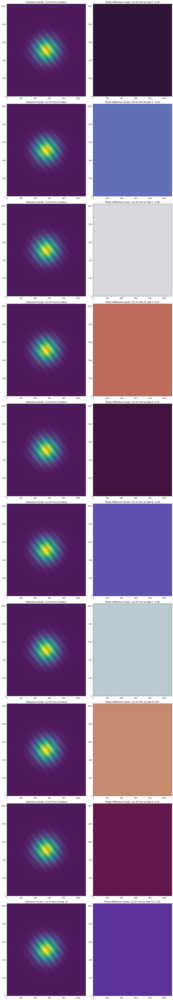

In [7]:
import matlab.engine
import numpy as np
import matplotlib.pyplot as plt

# Start MATLAB engine
eng = matlab.engine.start_matlab()

# Constants for this animation
time_steps = 10            # Number of time steps
time_resolution = 1800     # seconds, images are half an hour apart

# Assuming Xm and Ym are defined earlier in your code

# Wave packet parameters
cphase = 14  # m/s
wavelength = 150*1000  # meters
direction = 225  # FROM direction in degrees
zamplitude = 100  # meters, vertical displacement
PBLdepth = 1000  # m, divergent winds assumed to be constant through this layer

# Wavenumbers computed from wavelengths and direction, units radians per meter
k = 2 * np.pi / wavelength * np.sin(direction * np.pi / 180)
l = 2 * np.pi / wavelength * np.cos(direction * np.pi / 180)

# Amplitude modulation by a big smooth Gaussian
packet_width_x = 400*1000  # meters
packet_width_y = 300*1000  # meters

# Fixed time to freeze the wave pattern
t_fixed = 0  # Setting time to 0 to freeze the wave pattern

# Initial position for image1
packet_center_x = 0*1000  # meters
packet_center_y = 0*1000  # meters
Ampwindow = np.exp(-(((Xm - packet_center_x) / packet_width_x) ** 2 + \
                     ((Ym - packet_center_y) / packet_width_y) ** 2))

# Calculate image1 at the initial position
image1 = zamplitude * np.sin(k * (Xm - cphase * t_fixed) + l * (Ym - cphase * t_fixed)) * Ampwindow

# set up frame distance
frame_distance = 1

# Set up figure for animation
fig, ax = plt.subplots(time_steps, 2, figsize=(14, 8 * time_steps))  # Adjust the size accordingly

# Loop over the time steps to simulate the wave motion
for it in range(time_steps):
    t = it * frame_distance * time_resolution  # Calculate time for each image
    # Update the packet center based on the current time step
    packet_center_x = 0*it * 100*1000  # Example of linear movement
    packet_center_y = 0*it * 100*1000
    
    # Update amplitude window for current packet position
    Ampwindow = np.exp(-(((Xm - packet_center_x) / packet_width_x) ** 2 + \
                         ((Ym - packet_center_y) / packet_width_y) ** 2))
    
    # Generate image2 with the updated packet center but with the same fixed time
    image2 = zamplitude * np.sin(k * (Xm - cphase * t) + l * (Ym - cphase * t)) * Ampwindow

    # Convert images to MATLAB format
    image1_mat = matlab.double(image1.tolist())
    image2_mat = matlab.double(image2.tolist())

    # Define wavelet parameters
    wavelet_name = 'morlet'
    params = [2.0, 3.0, 1.0]
    wavelet_struct = {'name': wavelet_name, 'param': params}
    scales = [20]  # Focus on one scale
    scales_km = (4 * np.pi * np.array(scales)) / (params[0] + np.sqrt(2 + params[0]**2)) * 2  # Convert scales to km
    scales_matlab = matlab.double(scales)
    angles = [3*np.pi/4]  # Focus on one angle
    angles_matlab = matlab.double(angles)

    # Perform 2D CWT on both images
    cwt_image1 = np.array(eng.cwtft2(image1_mat, 'wavelet', wavelet_struct, 'scales', scales_matlab, 'angles', angles_matlab)['cfs'])
    cwt_image2 = np.array(eng.cwtft2(image2_mat, 'wavelet', wavelet_struct, 'scales', scales_matlab, 'angles', angles_matlab)['cfs'])

    # Compute the cross-wavelet spectrum (XWT)
    xwt = cwt_image1 * np.conj(cwt_image2)

    # Coherence (amplitude)
    coherence = np.abs(xwt)

    # Phase difference
    phase_difference = np.angle(xwt)

    # Step 1: Define a threshold for coherence
    coherence_threshold = 0 * np.max(coherence[:, :])

    # Step 2: Create a mask where coherence is above the threshold
    movement_mask = coherence[:, :] > coherence_threshold

    # Apply the mask to the phase difference
    phase_difference_masked = np.ma.masked_where(~movement_mask, phase_difference[:, :] / np.pi)

    # Plot Coherence for the selected scale
    ax[it, 0].pcolormesh(coherence[:, :], cmap='viridis')
    ax[it, 0].pcolormesh(image1, cmap='gray', alpha=0.2)
    ax[it, 0].set_title(f'Coherence (Scale: {scales_km[0]:.2f} km) at Step {it+1}')

    # Plot Phase Difference for the selected scale with masking applied
    ax[it, 1].pcolormesh(phase_difference_masked, cmap='twilight', vmin=-1, vmax=1)
    ax[it, 1].set_title(f'Phase Difference (Scale: {scales_km[0]:.2f} km) at Step {it+1} :{np.mean(phase_difference_masked):.2f}')

plt.tight_layout()
plt.show()

# End MATLAB session
eng.quit()


Real Phase Difference: [4.478426 4.478426 4.478426 ... 4.478426 4.478426 4.478426]
Observed Phase Difference: [1.80475931 1.80475931 1.80475931 ... 1.80475931 1.80475931 1.80475931]
Phase Error: [2.6736667 2.6736667 2.6736667 ... 2.6736667 2.6736667 2.6736667]


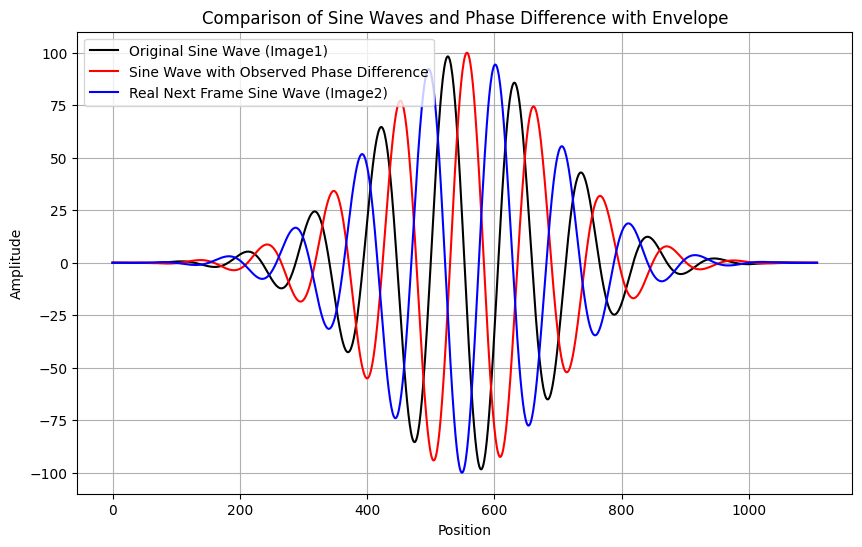

In [39]:
import matlab.engine
import numpy as np
import matplotlib.pyplot as plt

# Start MATLAB engine
eng = matlab.engine.start_matlab()

# Constants for this animation
time_resolution = 1800  # seconds, images are half an hour apart

# Assuming Xm and Ym are defined earlier in your code

# Wave packet parameters
cphase = 14  # m/s
wavelength = 150*1000  # meters
direction = 225  # FROM direction in degrees
zamplitude = 100  # meters, vertical displacement
PBLdepth = 1000  # m, divergent winds assumed to be constant through this layer

# Wavenumbers computed from wavelengths and direction, units radians per meter
k = 2 * np.pi / wavelength * np.sin(direction * np.pi / 180)
l = 2 * np.pi / wavelength * np.cos(direction * np.pi / 180)

# Amplitude modulation by a big smooth Gaussian
packet_width_x = 400*1000  # meters
packet_width_y = 300*1000  # meters

# Fixed time to freeze the wave pattern
t_fixed = 0  # Setting time to 0 to freeze the wave pattern

# Initial position for image1
packet_center_x = 0  # meters
packet_center_y = 0  # meters
Ampwindow = np.exp(-(((Xm - packet_center_x) / packet_width_x) ** 2 + \
                     ((Ym - packet_center_y) / packet_width_y) ** 2))

# Calculate image1 at the initial position
image1 = zamplitude * np.sin(k * (Xm - cphase * t_fixed) + l * (Ym - cphase * t_fixed)) * Ampwindow

# Set up a single comparison
frame_distance = 3
t = frame_distance * time_resolution  # Calculate time for the next image
packet_center_x = 0  # meters
packet_center_y = 0  # meters

# Update amplitude window for current packet position
Ampwindow = np.exp(-(((Xm - packet_center_x) / packet_width_x) ** 2 + \
                     ((Ym - packet_center_y) / packet_width_y) ** 2))

# Generate image2 with the updated packet center but with the same fixed time
image2 = zamplitude * np.sin(k * (Xm - cphase * t) + l * (Ym - cphase * t)) * Ampwindow

# Convert images to MATLAB format
image1_mat = matlab.double(image1.tolist())
image2_mat = matlab.double(image2.tolist())

# Define wavelet parameters
wavelet_name = 'morlet'
params = [2.0, 3.0, 1.0]
wavelet_struct = {'name': wavelet_name, 'param': params}
scales = [20]  # Focus on one scale
scales_km = (4 * np.pi * np.array(scales)) / (params[0] + np.sqrt(2 + params[0]**2)) * 2  # Convert scales to km
scales_matlab = matlab.double(scales)
angles = [3*np.pi/4]  # Focus on one angle
angles_matlab = matlab.double(angles)

# Perform 2D CWT on both images
cwt_image1 = np.array(eng.cwtft2(image1_mat, 'wavelet', wavelet_struct, 'scales', scales_matlab, 'angles', angles_matlab)['cfs'])
cwt_image2 = np.array(eng.cwtft2(image2_mat, 'wavelet', wavelet_struct, 'scales', scales_matlab, 'angles', angles_matlab)['cfs'])

# Compute the cross-wavelet spectrum (XWT)
xwt = cwt_image1 * np.conj(cwt_image2)

# Coherence (amplitude)
coherence = np.abs(xwt)

# Observed Phase difference
observed_phase_difference = np.angle(xwt)

# Calculate the real phase difference
# Real phase in image1 and image2
real_phase_image1 = k * Xm + l * Ym
real_phase_image2 = k * (Xm - cphase * t) + l * (Ym - cphase * t)

# Real phase difference
real_phase_difference = real_phase_image2 - real_phase_image1

# Error in phase detection
phase_error = np.abs(observed_phase_difference - real_phase_difference)

# Choose a specific row or column for side view, here we use the middle row
row = image1.shape[0] // 2

# Extract slices for plotting
slice_image1 = image1[row, :]
slice_image2 = image2[row, :]
slice_phase_difference = zamplitude * np.sin(real_phase_image1[row, :] + observed_phase_difference[row, :]) * Ampwindow[row, :]

# Print the calculated phases and error for the specific row
print("Real Phase Difference:", real_phase_difference[row, :])
print("Observed Phase Difference:", observed_phase_difference[row, :])
print("Phase Error:", phase_error[row, :])

# Plot slices
plt.figure(figsize=(10, 6))
plt.plot(slice_image1, label='Original Sine Wave (Image1)', color='black')
plt.plot(slice_phase_difference, label='Sine Wave with Observed Phase Difference', color='red')
plt.plot(slice_image2, label='Real Next Frame Sine Wave (Image2)', color='blue')

plt.title('Comparison of Sine Waves and Phase Difference with Envelope')
plt.xlabel('Position')
plt.ylabel('Amplitude')
plt.legend()
plt.grid(True)
plt.show()

# End MATLAB session
eng.quit()

### Angle/scale detection

Let's start again from the beginning 

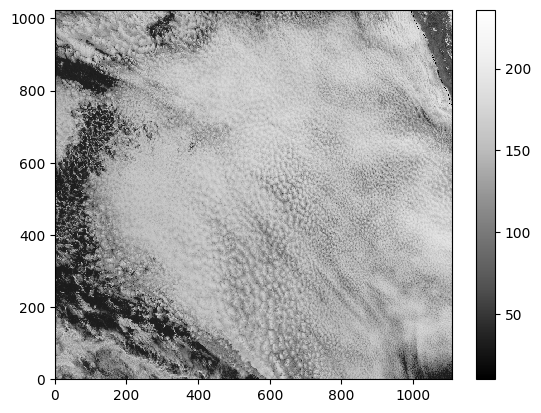

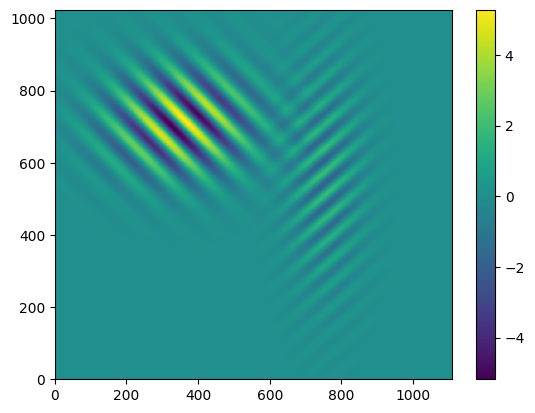

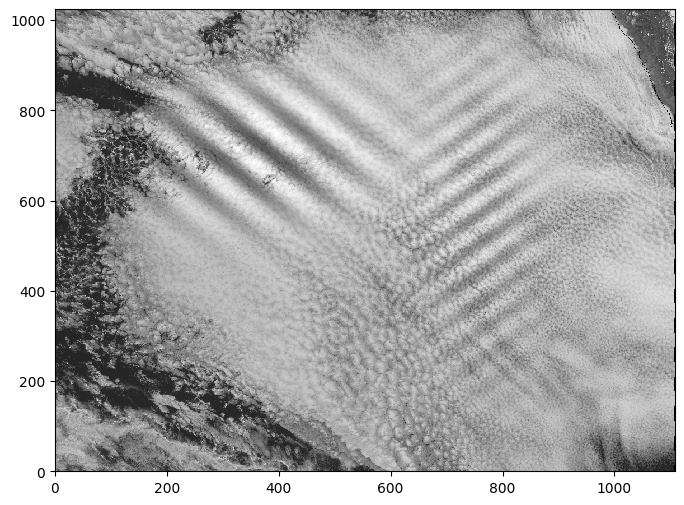

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import imageio
from glob import glob 

# https://docs.scipy.org/doc/scipy/reference/generated/scipy.ndimage.map_coordinates.html

import scipy 
from scipy import ndimage

# Define the path to the directory containing the images
path = 'C:\\Users\\ratynski\\Documents\\Python_Projects\\stratocu_waves-main\\DATA\\2022_09_06\\'
# Use glob to find the images in the specified path
fnames = np.sort(glob(path + '*9_06*png'))
images = []

# Read the images and process them
for i, fname in enumerate(fnames):
    img = imageio.v2.imread(fname)
    red = np.flipud(img[:, 400:, 0])
    images.append(red)  # Just red channel, just 400:end in the x dir, flip y

# Plot the first processed image
plt.pcolormesh(images[0], cmap='Greys_r')
plt.colorbar()
plt.show()

# Get the dimensions of the image
height, width = red.shape[:2]

# Create 2D arrays of x and y
x = np.arange(width)
y = np.arange(height)

# Create a meshgrid of x and y
X, Y = np.meshgrid(x, y)


# Pixel size: nominal for MKS units to pixel units 
DX = 2000             # m, pixel size (nominal)

# Xm and Ym are Coordinates in meters, distances measured from central point of image
Xm = (X-X.mean())*DX
Ym = (Y-Y.mean())*DX 
# One wave packet 
cphase = 14            # m/s
wavelength = 150*1000. # meters
period = wavelength/cphase 
direction = 225       # navigation angle of FROM direction in degrees (225 = FROM SW, toward NE) 
zamplitude = 100      # meters, vertical displacement
PBLdepth = 1000       # m, divergent winds assumed to be constant through this layer  

# Wavenumbers computed from wavelengths and direction, units radians per meter
k = 2*np.pi/wavelength * np.sin( (direction) *np.pi/180 )   
l = 2*np.pi/wavelength * np.cos( (direction) *np.pi/180 )   

# Amplitude modulation by a big smooth Gaussian 
packet_center_x = -400*1000  # meters, from middle of Xm, Ym coordinates  
packet_center_y = 400*1000   # meters, from middle of Xm, Ym coordinates  
packet_width_x  = 400*1000.  # meters
packet_width_y  = 300*1000.  # meters
Ampwindow = np.exp(-( ((Xm-packet_center_x)/packet_width_x)**2 + \
                      ((Ym-packet_center_y)/packet_width_y)**2 )) 
     
#plt.pcolormesh(Ampwindow); plt.colorbar()

# A second wave packet 
cphase2 = 20            # m/s
wavelength2 = 100*1000. # meters
period2 = wavelength2/cphase2 
direction2 = 140       # navigation angle of FROM direction in degrees (225 = FROM SW, toward NE) 
zamplitude2 = 50      # meters, vertical displacement
PBLdepth2 = 1000       # m, divergent winds assumed to be constant through this layer  

# Wavenumbers computed from wavelengths and direction, units radians per meter
k2 = 2*np.pi/wavelength2 * np.sin( (direction2) *np.pi/180 )   
l2 = 2*np.pi/wavelength2 * np.cos( (direction2) *np.pi/180 )   

# Amplitude modulation by a big smooth Gaussian 
packet_center_x2 = 400*1000  # meters, from middle of Xm, Ym coordinates  
packet_center_y2 = 100*1000   # meters, from middle of Xm, Ym coordinates  
packet_width_x2  = 200*1000.  # meters
packet_width_y2  = 600*1000.  # meters
Ampwindow2 = np.exp(-( ((Xm-packet_center_x2)/packet_width_x2)**2 + \
                      ( (Ym-packet_center_y2)/packet_width_y2)**2 )) 
     

     # Constants for this animation 
time_steps = 10            # Number of time steps 
time_resolution = 1800     # seconds, images are half an hour apart

# The resulting image arrays, for animation 
grid = np.zeros((height, width, time_steps))


# BUILD THE WARPED MODULATED IMAGES AT EACH TIME

for it in range(time_steps):
    t = it*time_resolution     # t is in seconds 

# dz measures vertical displacements: let's choose the sine function. Two packets 
    dz = zamplitude \
         * np.sin( k*(Xm - cphase*t)+l*(Ym - cphase*t) ) *Ampwindow 
    dz2 = zamplitude2 \
         * np.sin( k2*(Xm - cphase2*t)+l2*(Ym - cphase2*t) ) *Ampwindow2

# wave dx and dy are 90deg behind phase with dz, prop. to wavelength. 
# DIRECTION: For 45deg (wave going NE), k>0,l>0, dx>0,dy>0 (sketch it). 

    dxy = (zamplitude/PBLdepth)*wavelength \
          * np.sin( k*(Xm - cphase*t)+l*(Ym - cphase*t) -np.pi/2.) /DX
    dx = dxy * np.sin(direction *np.pi/180.) *Ampwindow # why /2? because it is too strong. Pixel units?? 
    dy = dxy * np.cos(direction *np.pi/180.) *Ampwindow

    dxy2= (zamplitude2/PBLdepth2)*wavelength2 \
          * np.sin( k2*(Xm - cphase2*t)+l2*(Ym - cphase2*t) -np.pi/2.) /DX
    dx2= dxy2* np.sin(direction2 *np.pi/180.) *Ampwindow2 
    dy2= dxy2* np.cos(direction2 *np.pi/180.) *Ampwindow2

# Warping by transporting pixels in original red image, wrapping (periodic) for now. SUBTRACT dy and dx in argument. 
    grid[:,:,it] = ndimage.map_coordinates(images[it],[Y-dy-dy2, X-dx-dx2])  

# Modulate (multiply) albedo by a wavy pattern (vertical displacements, 
#           make consistent with xmotion and ymotion arrays above) 
    grid[:,:,it] *= (1 + dz /PBLdepth  *5) 
    grid[:,:,it] *= (1 + dz2/PBLdepth2 *5) 

maxvalue = grid.max()
maxvalue

plt.pcolormesh(dy+dy2); plt.colorbar(); # pixels units -- surprising that 7 pixels make such a huge warp?

plt.figure(figsize=(8,6))
plt.pcolormesh(grid[:,:,0], cmap='Greys_r')

In [2]:
import matlab.engine
import numpy as np
import matplotlib.pyplot as plt

# Start MATLAB engine
eng = matlab.engine.start_matlab()

# Load two images (e.g., image1 and image2)
image1 = grid[:,:,0]
image2 = grid[:,:,1]

image1_mat = matlab.double(image1.tolist())
image2_mat = matlab.double(image2.tolist())

# Define wavelet parameters
wavelet_name = 'morlet'
params = [2.0, 3.0, 1.0]
wavelet_struct = {'name': wavelet_name, 'param': params}
scales = np.linspace(1, 51, 11)
scales_matlab = matlab.double(scales.tolist())
scales_km = (4 * np.pi * scales) / (params[0] + np.sqrt(2 + params[0]**2)) * 2  # Convert scales to km
angles = [0, np.pi/4, np.pi/2, 3*np.pi/4, np.pi]  # Focus on specific angles
angles_matlab = matlab.double(angles)

# Perform 2D CWT on both images
cwt_image1 = np.array(eng.cwtft2(image1_mat, 'wavelet', wavelet_struct, 'scales', scales_matlab, 'angles', angles_matlab)['cfs'])

# display the array size
cwt_image1.shape


(1024, 1108, 1, 11, 5)

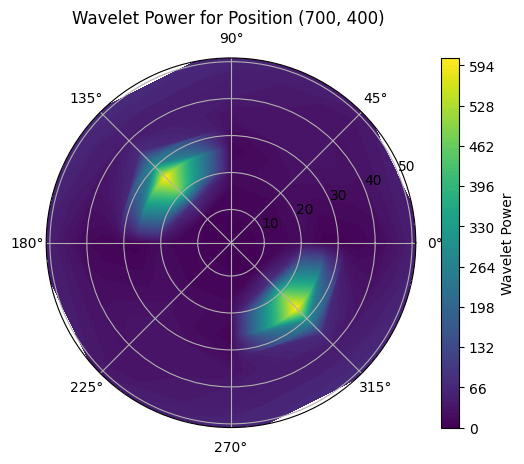

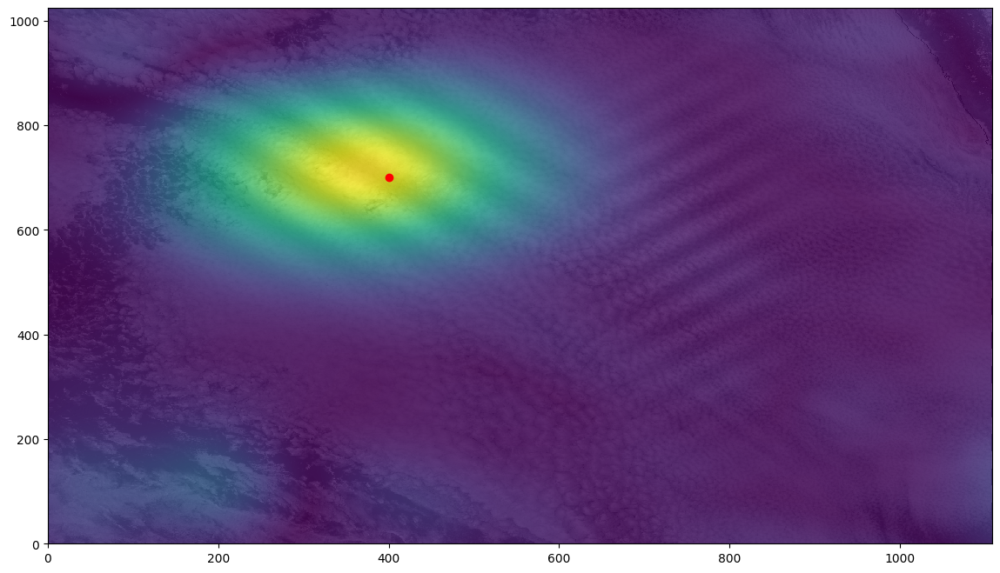

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

# Assume we have the results of the 2D wavelet transform
# cwt_image1 is the coefficient matrix (with dimensions [1024, 1108, 1, 11, 4])
# Example: cwt_image1 = np.random.random((1024, 1108, 1, 11, 4)) + 1j * np.random.random((1024, 1108, 1, 11, 4))  # Placeholder for real coefficients

# Select a case (i, j) for visualization, e.g., (512, 554)
i, j = 700, 400

# Extract the coefficients for this case, ignoring the color dimension
coeffs = cwt_image1[i, j, 0, :, :]  # Shape: (11, 4)

# Take the magnitude of the complex coefficients
coeffs_magnitude = np.abs(coeffs)

# Complete the values to cover the full circle (0 to 2*pi)
coeffs_magnitude = np.concatenate([coeffs_magnitude, coeffs_magnitude], axis=1)

# Define scales and angles for the upper half
scales = np.linspace(1, 51, 11)  # Scales used
angles = np.linspace(0, np.pi, coeffs_magnitude.shape[1] // 2)  # Angles for the upper half (0 to pi)

# Create the polar plot
fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})

# Create a grid for the contours
theta, r = np.meshgrid(angles, scales)

# Create a filled contour plot with color representing the power
c = ax.contourf(theta, r, coeffs_magnitude[:, :len(angles)], 100, cmap='viridis', norm=Normalize(vmin=np.min(coeffs_magnitude), vmax=np.max(coeffs_magnitude)))
# Add a symmetric reflection for the lower half by shifting the angles
c = ax.contourf(-theta, r, coeffs_magnitude[:, :len(angles)][:, ::-1], 100, cmap='viridis', norm=Normalize(vmin=np.min(coeffs_magnitude), vmax=np.max(coeffs_magnitude)))


# Adjust the 0 degree direction to the right (East) and make the angles counterclockwise
ax.set_theta_zero_location("E")
ax.set_theta_direction(1)  # 1 for counterclockwise

# Add a color bar
fig.colorbar(c, ax=ax, label='Wavelet Power')

# Add titles and labels
ax.set_title(f'Wavelet Power for Position ({i}, {j}) ')

# Show the figure
plt.show()

# Plot the first scale and angle
plt.figure(figsize=(14, 8))
plt.pcolormesh(np.abs(cwt_image1[:, :, 0, 4, 3]), cmap='viridis')
plt.pcolormesh(image1, cmap='gray', alpha=0.2)
plt.scatter(j, i, color='red')


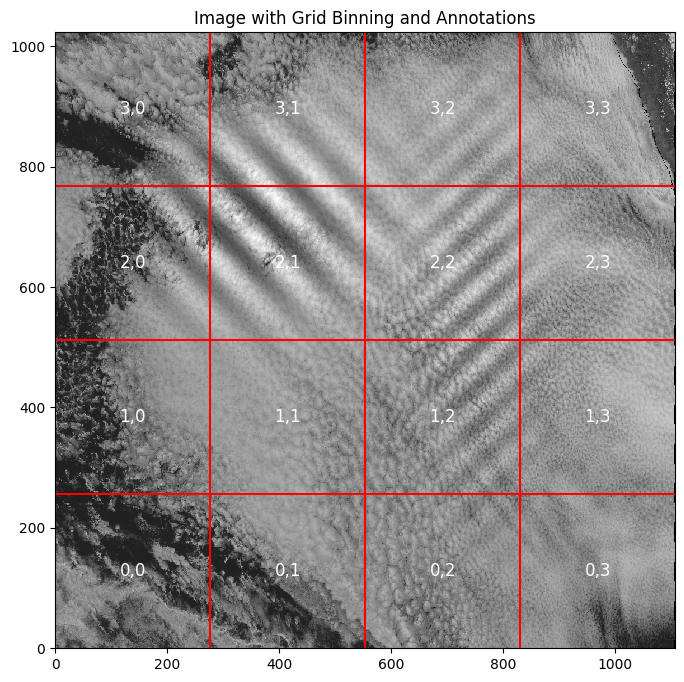

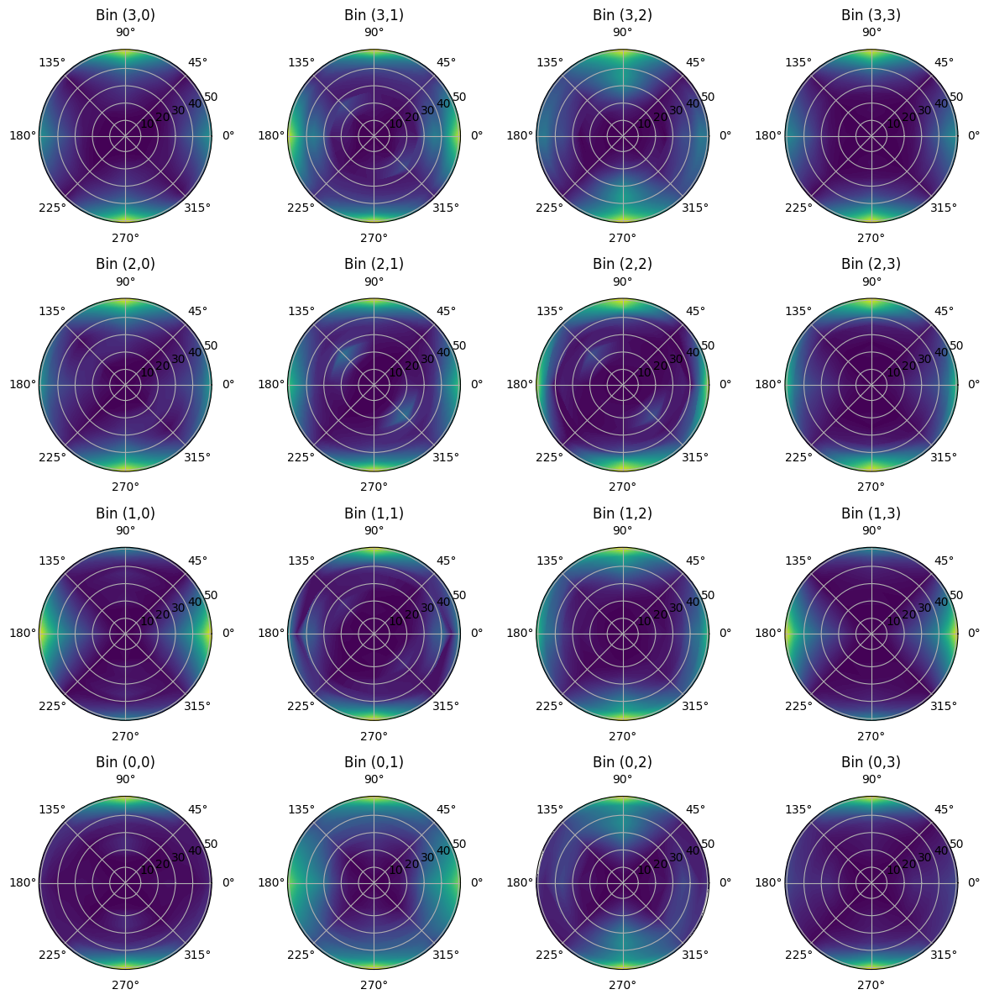

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

# Assume we have the results of the 2D wavelet transform
# cwt_image1 is the coefficient matrix (with dimensions [1024, 1108, 1, 11, 5])

# image1 is already defined earlier in the program
# Divide the image into a 4x4 grid
n_bins_x, n_bins_y = 4, 4
bin_size_x = image1.shape[0] // n_bins_x
bin_size_y = image1.shape[1] // n_bins_y

# Display the image and grid using pcolormesh, with bin annotations
fig, ax = plt.subplots(figsize=(8, 8))
c = ax.pcolormesh(np.arange(image1.shape[1]), np.arange(image1.shape[0]), image1, cmap='gray')
ax.set_title('Image with Grid Binning and Annotations')

# Add grid lines
for i in range(1, n_bins_x):
    ax.axhline(i * bin_size_x, color='red')
for j in range(1, n_bins_y):
    ax.axvline(j * bin_size_y, color='red')

# Add annotations for the bins
for i in range(n_bins_x):
    for j in range(n_bins_y):
        x_start = i * bin_size_x
        y_start = j * bin_size_y
        # Annotate each bin with its index
        ax.text(y_start + bin_size_y / 2, x_start + bin_size_x / 2, f'{i},{j}', color='white', 
                ha='center', va='center', fontsize=12)

plt.show()

# Create the 4x4 subplots to display the roses for each bin, but flip the vertical axis (i)
fig, axs = plt.subplots(n_bins_x, n_bins_y, subplot_kw={'projection': 'polar'}, figsize=(12, 12))

# Iterate over each bin, but reverse the order of 'i' to match the image orientation
for i in range(n_bins_x):
    for j in range(n_bins_y):
        # Flip the index i to match the orientation of the image
        flipped_i = n_bins_x - 1 - i
        
        # Calculate the indices for the bins
        x_start = i * bin_size_x
        x_end = (i + 1) * bin_size_x
        y_start = j * bin_size_y
        y_end = (j + 1) * bin_size_y
        
        # Extract the sub-image corresponding to the bin
        sub_image = cwt_image1[x_start:x_end, y_start:y_end, 0, :, :]

        # Average the coefficients for this bin
        coeffs = np.mean(sub_image, axis=(0, 1))
        coeffs_magnitude = np.abs(coeffs)

        # Define scales and angles for the upper half
        scales = np.linspace(1, 51, 11)  # Scales used
        angles = np.linspace(0, np.pi, coeffs_magnitude.shape[1])  # Angles for half circle

        # Create the polar plot for this bin
        theta, r = np.meshgrid(angles, scales)

        # Plot the rose in the corresponding subplot (upper half only)
        axs[flipped_i, j].contourf(theta, r, coeffs_magnitude, 100, cmap='viridis', 
                                   norm=Normalize(vmin=np.min(coeffs_magnitude), vmax=np.max(coeffs_magnitude)))
        axs[flipped_i, j].contourf(-theta, r, coeffs_magnitude[:, ::-1], 100, cmap='viridis', 
                                   norm=Normalize(vmin=np.min(coeffs_magnitude), vmax=np.max(coeffs_magnitude)))

        # Set the 0 degree to the right (East) and make angles counterclockwise
        axs[flipped_i, j].set_theta_zero_location("E")
        axs[flipped_i, j].set_theta_direction(1)  # 1 for counterclockwise

        # Add the title with the bin indices for each subplot
        axs[flipped_i, j].set_title(f'Bin ({i},{j})')

# Adjust spacing between subplots
plt.tight_layout()
plt.show()


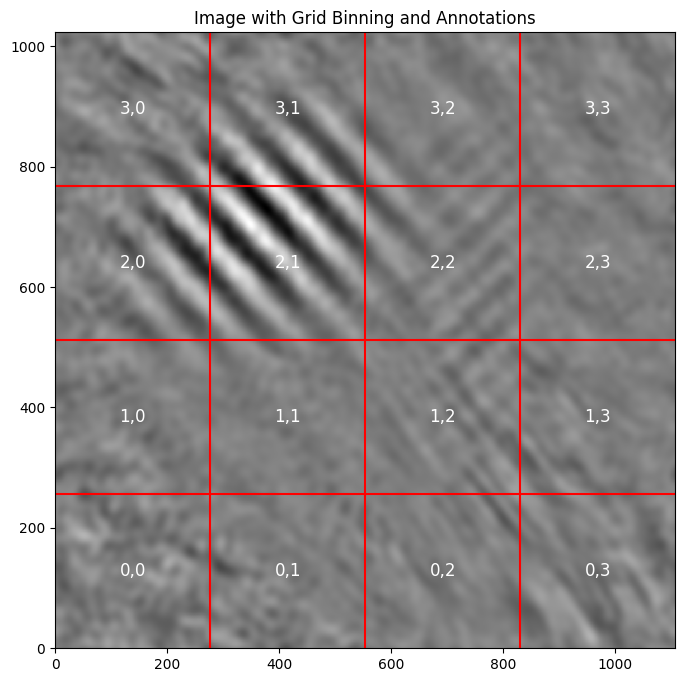

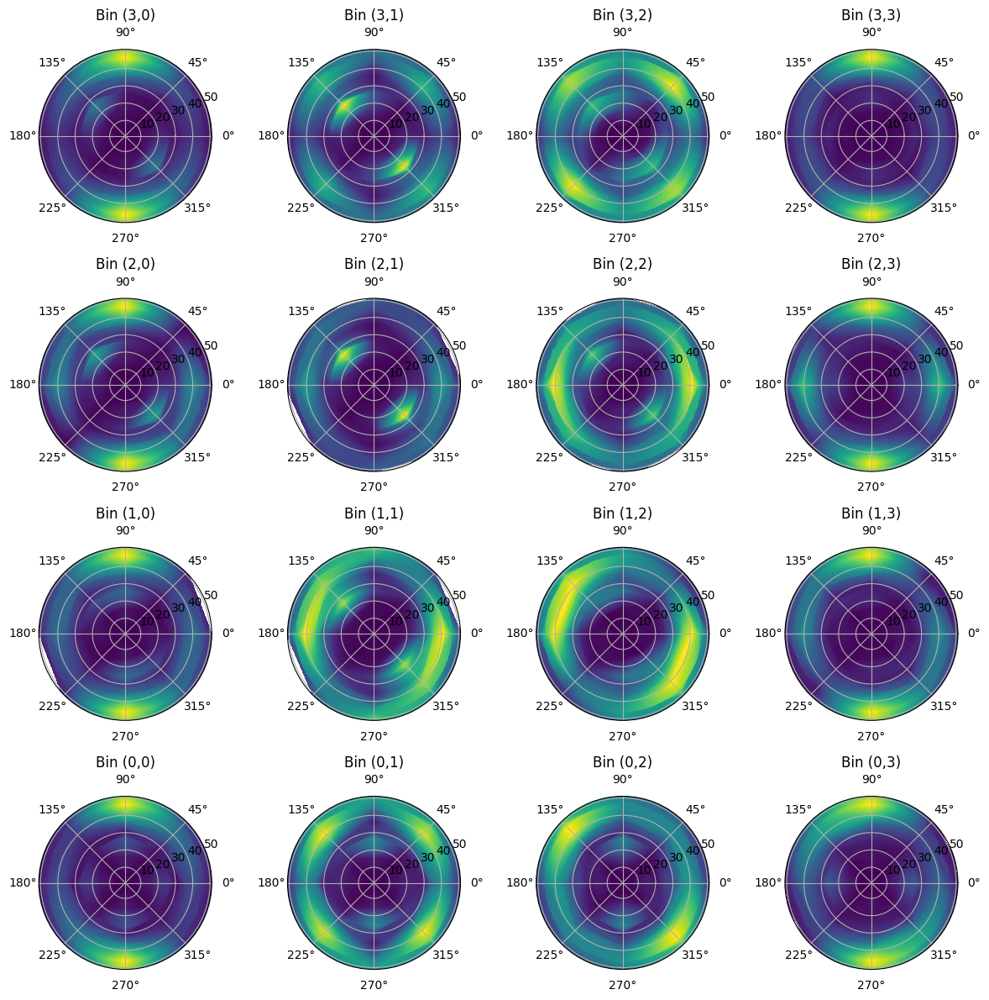

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize

import matlab.engine
import numpy as np
import matplotlib.pyplot as plt
from numpy.fft import fft2, ifft2, fftshift, ifftshift
from Eof_functions import filter_frames

import matlab.engine
import numpy as np
import matplotlib.pyplot as plt

# Start MATLAB engine
eng = matlab.engine.start_matlab()

kl_inf = 0.00666666666  # 300 Km
kl_sup = 0.06666666666  # 30 Km
cf_inf = 12 
c_sup = 17 

# Filter the frames based on the same parameters
frames_disp = filter_frames(grid, kl_inf, kl_sup, cf_inf, c_sup)

# Load two images (e.g., image1 and image2)
image1 = frames_disp [:,:,0]
image2 = frames_disp [:,:,1]

image1_mat = matlab.double(image1.tolist())
image2_mat = matlab.double(image2.tolist())

# Define wavelet parameters
wavelet_name = 'morlet'
params = [2.0, 3.0, 1.0]
wavelet_struct = {'name': wavelet_name, 'param': params}
scales = np.linspace(1, 51, 11)
scales_matlab = matlab.double(scales.tolist())
scales_km = (4 * np.pi * scales) / (params[0] + np.sqrt(2 + params[0]**2)) * 2  # Convert scales to km
angles = [0, np.pi/4, np.pi/2, 3*np.pi/4, np.pi]  # Focus on specific angles
angles_matlab = matlab.double(angles)

# Perform 2D CWT on both images
cwt_image1 = np.array(eng.cwtft2(image1_mat, 'wavelet', wavelet_struct, 'scales', scales_matlab, 'angles', angles_matlab)['cfs'])

# image1 is already defined earlier in the program
# Divide the image into a 4x4 grid
n_bins_x, n_bins_y = 4, 4
bin_size_x = image1.shape[0] // n_bins_x
bin_size_y = image1.shape[1] // n_bins_y

# Display the image and grid using pcolormesh, with bin annotations
fig, ax = plt.subplots(figsize=(8, 8))
c = ax.pcolormesh(np.arange(image1.shape[1]), np.arange(image1.shape[0]), image1, cmap='gray')
ax.set_title('Image with Grid Binning and Annotations')

# Add grid lines
for i in range(1, n_bins_x):
    ax.axhline(i * bin_size_x, color='red')
for j in range(1, n_bins_y):
    ax.axvline(j * bin_size_y, color='red')

# Add annotations for the bins
for i in range(n_bins_x):
    for j in range(n_bins_y):
        x_start = i * bin_size_x
        y_start = j * bin_size_y
        # Annotate each bin with its index
        ax.text(y_start + bin_size_y / 2, x_start + bin_size_x / 2, f'{i},{j}', color='white', 
                ha='center', va='center', fontsize=12)

plt.show()

# Create the 4x4 subplots to display the roses for each bin, but flip the vertical axis (i)
fig, axs = plt.subplots(n_bins_x, n_bins_y, subplot_kw={'projection': 'polar'}, figsize=(12, 12))

# Iterate over each bin, but reverse the order of 'i' to match the image orientation
for i in range(n_bins_x):
    for j in range(n_bins_y):
        # Flip the index i to match the orientation of the image
        flipped_i = n_bins_x - 1 - i
        
        # Calculate the indices for the bins
        x_start = i * bin_size_x
        x_end = (i + 1) * bin_size_x
        y_start = j * bin_size_y
        y_end = (j + 1) * bin_size_y
        
        # Extract the sub-image corresponding to the bin
        sub_image = cwt_image1[x_start:x_end, y_start:y_end, 0, :, :]

        # Average the coefficients for this bin
        coeffs = np.mean(sub_image, axis=(0, 1))
        coeffs_magnitude = np.abs(coeffs)

        # Define scales and angles for the upper half
        scales = np.linspace(1, 51, 11)  # Scales used
        angles = np.linspace(0, np.pi, coeffs_magnitude.shape[1])  # Angles for half circle

        # Create the polar plot for this bin
        theta, r = np.meshgrid(angles, scales)

        # Plot the rose in the corresponding subplot (upper half only)
        axs[flipped_i, j].contourf(theta, r, coeffs_magnitude, 100, cmap='viridis', 
                                   norm=Normalize(vmin=np.min(coeffs_magnitude), vmax=np.max(coeffs_magnitude)))
        axs[flipped_i, j].contourf(-theta, r, coeffs_magnitude[:, ::-1], 100, cmap='viridis', 
                                   norm=Normalize(vmin=np.min(coeffs_magnitude), vmax=np.max(coeffs_magnitude)))

        # Set the 0 degree to the right (East) and make angles counterclockwise
        axs[flipped_i, j].set_theta_zero_location("E")
        axs[flipped_i, j].set_theta_direction(1)  # 1 for counterclockwise

        # Add the title with the bin indices for each subplot
        axs[flipped_i, j].set_title(f'Bin ({i},{j})')

# Adjust spacing between subplots
plt.tight_layout()
plt.show()
